In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import plotly.express as pe

In [ ]:
df=pd.read_csv("US_Regional_Sales_Data.csv")
df

# COLUMN DESCRIPTION

|Column| Description|
|------| -----------|
|OrderNumber|Shows Unique identifier for each order|
|Sales Channel|The channel through the sales was made|
|WarehouseCode|Code representing the warehouse involved in the order.|
|ProcuredDate| Date when the products were procured.|
|OrderDate|Date when the order was placed.|
|ShipDate|Date when the order was shipped.|
|DeliveryDate|Date when the order was delivered.|
|CurrencyCode| It shows what types of currency used in that particular area|
|_SalesTeamID| Identifier for the sales team involved.|
|_CustomerID| Identifier for the customer.|
|_StoreID|Identifier for the store.|
|_ProductID|Identifier for the product.|
|Order Quantity|Quantity of products ordered.|
|Discount Applied|Applied discount for the order.|
|Unit Cost|Cost of a single unit of the product.|
|Unit Price|Price at which the product was sold.|


# Data Information

Data info shows all information about the dataset like how many columns and rows present in the dataset,shows every column datatype

In [ ]:
df.info()

Convert all the date columns datatype from object to Datetime

In [ ]:
df['ProcuredDate'] = pd.to_datetime(df['ProcuredDate'])
df['OrderDate'] = pd.to_datetime(df['OrderDate'])
df['ShipDate'] = pd.to_datetime(df['ShipDate'])
df['DeliveryDate'] = pd.to_datetime(df['DeliveryDate'])


In [68]:
df['Unit Cost'] = df['Unit Cost'].astype(str).str.replace(',', '', regex=True).astype('float64')
df['Unit Price'] = df['Unit Price'].astype(str).str.replace(',', '', regex=True).astype('float64')

In [69]:
df

,OrderNumber,Sales Channel,WarehouseCode,ProcuredDate,OrderDate,ShipDate,DeliveryDate,CurrencyCode,_SalesTeamID,_CustomerID,_StoreID,_ProductID,Order Quantity,Discount Applied,Unit Cost,Unit Price
0,SO - 000101,In-Store,WARE-UHY1004,2017-12-31,2018-05-31,2018-06-14,2018-06-19,USD,6,15,259,12,5,0.075,1001.18,1963.1
1,SO - 000102,Online,WARE-NMK1003,2017-12-31,2018-05-31,2018-06-22,2018-02-07,USD,14,20,196,27,3,0.075,3348.66,3939.6
2,SO - 000103,Distributor,WARE-UHY1004,2017-12-31,2018-05-31,2018-06-21,2018-01-07,USD,21,16,213,16,1,0.050,781.22,1775.5
3,SO - 000104,Wholesale,WARE-NMK1003,2017-12-31,2018-05-31,2018-02-06,2018-07-06,USD,28,48,107,23,8,0.075,1464.69,2324.9
4,SO - 000105,Distributor,WARE-NMK1003,2018-10-04,2018-05-31,2018-06-16,2018-06-26,USD,22,49,111,26,8,0.100,1476.14,1822.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7986,SO - 0008087,In-Store,WARE-MKL1006,2020-09-26,2020-12-30,2021-07-01,2021-01-14,USD,9,41,339,29,1,0.075,121.94,234.5
7987,SO - 0008088,Online,WARE-NMK1003,2020-09-26,2020-12-30,2021-02-01,2021-04-01,USD,14,29,202,3,6,0.050,1921.56,3202.6
7988,SO - 0008089,Online,WARE-UHY1004,2020-09-26,2020-12-30,2021-01-23,2021-01-26,USD,14,32,241,35,5,0.200,2792.76,3825.7
7989,SO - 0008090,Online,WARE-NMK1003,2020-09-26,2020-12-30,2021-01-20,2021-01-25,USD,20,42,112,36,8,0.100,804.00,1072.0


In [70]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7991 entries, 0 to 7990
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   OrderNumber       7991 non-null   object        
 1   Sales Channel     7991 non-null   object        
 2   WarehouseCode     7991 non-null   object        
 3   ProcuredDate      7991 non-null   datetime64[ns]
 4   OrderDate         7991 non-null   datetime64[ns]
 5   ShipDate          7991 non-null   datetime64[ns]
 6   DeliveryDate      7991 non-null   datetime64[ns]
 7   CurrencyCode      7991 non-null   object        
 8   _SalesTeamID      7991 non-null   int64         
 9   _CustomerID       7991 non-null   int64         
 10  _StoreID          7991 non-null   int64         
 11  _ProductID        7991 non-null   int64         
 12  Order Quantity    7991 non-null   int64         
 13  Discount Applied  7991 non-null   float64       
 14  Unit Cost         7991 n

In [71]:
df

,OrderNumber,Sales Channel,WarehouseCode,ProcuredDate,OrderDate,ShipDate,DeliveryDate,CurrencyCode,_SalesTeamID,_CustomerID,_StoreID,_ProductID,Order Quantity,Discount Applied,Unit Cost,Unit Price
0,SO - 000101,In-Store,WARE-UHY1004,2017-12-31,2018-05-31,2018-06-14,2018-06-19,USD,6,15,259,12,5,0.075,1001.18,1963.1
1,SO - 000102,Online,WARE-NMK1003,2017-12-31,2018-05-31,2018-06-22,2018-02-07,USD,14,20,196,27,3,0.075,3348.66,3939.6
2,SO - 000103,Distributor,WARE-UHY1004,2017-12-31,2018-05-31,2018-06-21,2018-01-07,USD,21,16,213,16,1,0.050,781.22,1775.5
3,SO - 000104,Wholesale,WARE-NMK1003,2017-12-31,2018-05-31,2018-02-06,2018-07-06,USD,28,48,107,23,8,0.075,1464.69,2324.9
4,SO - 000105,Distributor,WARE-NMK1003,2018-10-04,2018-05-31,2018-06-16,2018-06-26,USD,22,49,111,26,8,0.100,1476.14,1822.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7986,SO - 0008087,In-Store,WARE-MKL1006,2020-09-26,2020-12-30,2021-07-01,2021-01-14,USD,9,41,339,29,1,0.075,121.94,234.5
7987,SO - 0008088,Online,WARE-NMK1003,2020-09-26,2020-12-30,2021-02-01,2021-04-01,USD,14,29,202,3,6,0.050,1921.56,3202.6
7988,SO - 0008089,Online,WARE-UHY1004,2020-09-26,2020-12-30,2021-01-23,2021-01-26,USD,14,32,241,35,5,0.200,2792.76,3825.7
7989,SO - 0008090,Online,WARE-NMK1003,2020-09-26,2020-12-30,2021-01-20,2021-01-25,USD,20,42,112,36,8,0.100,804.00,1072.0


By using describe we can check mean,median,mode,precentile,mac,count,std
By seeing the difference between mean() and 50% means median we can check is there nay skewness present or not

In [72]:
df.describe()

,_SalesTeamID,_CustomerID,_StoreID,_ProductID,Order Quantity,Discount Applied,Unit Cost,Unit Price
count,7991.000000,7991.000000,7991.000000,7991.000000,7991.000000,7991.000000,7991.000000,7991.000000
mean,14.384307,25.457014,183.850081,23.771743,4.525341,0.114394,1431.911513,2284.536504
std,7.986086,14.414883,105.903946,13.526545,2.312631,0.085570,1112.413063,1673.096364
min,1.000000,1.000000,1.000000,1.000000,1.000000,0.050000,68.680000,167.500000
25%,8.000000,13.000000,91.000000,12.000000,3.000000,0.050000,606.120000,1031.800000
50%,14.000000,25.000000,183.000000,24.000000,5.000000,0.075000,1080.580000,1849.200000
75%,21.000000,38.000000,276.000000,36.000000,7.000000,0.150000,2040.250000,3611.300000
max,28.000000,50.000000,367.000000,47.000000,8.000000,0.400000,5498.560000,6566.000000


isna() shows in this datatype any null value present or not in that dataset <br>
if nay null value is there we have to remove that <br>
1)if null_value>3% we have to we dropna <br>
2) if null value > 3% and < 50% we will fill that null value by using mean,median,mode <br>
a)if there is no skewness in that column means the data is nomally distributed we will use mean()<br>
b) if there is skewness present we will use median<br>
c) if the value is categorical we will use mode<br>
3)if null_value>50% we will drop that column<br>

In [73]:
df.isna().sum()/len(df)*100

OrderNumber         0.0
Sales Channel       0.0
WarehouseCode       0.0
ProcuredDate        0.0
OrderDate           0.0
ShipDate            0.0
DeliveryDate        0.0
CurrencyCode        0.0
_SalesTeamID        0.0
_CustomerID         0.0
_StoreID            0.0
_ProductID          0.0
Order Quantity      0.0
Discount Applied    0.0
Unit Cost           0.0
Unit Price          0.0
dtype: float64

In duplicated value False means there are no duplicate values in the dataset

In [74]:
df.duplicated().value_counts()

False    7991
dtype: int64

Here we use for loop to see all the unique value present in each column with count

In [75]:
for col in df:
    print(df[col].value_counts())

SO - 000101     1
SO - 0005424    1
SO - 0005437    1
SO - 0005436    1
SO - 0005435    1
               ..
SO - 0002760    1
SO - 0002759    1
SO - 0002758    1
SO - 0002757    1
SO - 0008091    1
Name: OrderNumber, Length: 7991, dtype: int64
In-Store       3298
Online         2425
Distributor    1375
Wholesale       893
Name: Sales Channel, dtype: int64
WARE-NMK1003    2505
WARE-PUJ1005    1451
WARE-UHY1004    1265
WARE-XYS1001    1222
WARE-MKL1006     857
WARE-NBV1002     691
Name: WarehouseCode, dtype: int64
2020-06-18    865
2019-01-12    856
2020-10-03    854
2018-10-27    853
2018-07-19    843
2019-04-02    843
2019-08-23    835
2018-10-04    825
2019-05-15    808
2020-09-26    299
2017-12-31    110
Name: ProcuredDate, dtype: int64
2018-04-08    21
2019-04-05    20
2019-01-20    19
2019-04-04    18
2019-03-06    17
              ..
2018-10-07     2
2019-11-10     1
2019-03-28     1
2020-11-27     1
2020-03-20     1
Name: OrderDate, Length: 945, dtype: int64
2019-12-08    18
2020

# Exploratory Data Analysis

In [76]:
col=df.columns
col

Index(['OrderNumber', 'Sales Channel', 'WarehouseCode', 'ProcuredDate',
       'OrderDate', 'ShipDate', 'DeliveryDate', 'CurrencyCode', '_SalesTeamID',
       '_CustomerID', '_StoreID', '_ProductID', 'Order Quantity',
       'Discount Applied', 'Unit Cost', 'Unit Price'],
      dtype='object')

In [77]:
for i in df.columns:
    fig = pe.histogram(df, x=i,title=f"the distribution of {i} column", marginal="box")
    fig.show()

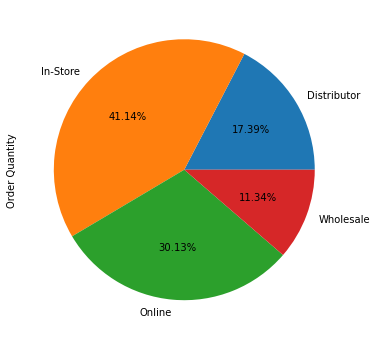

In [78]:
# sales channel-wise quantity ordered
plt.figure(figsize=(19, 6))
df.groupby('Sales Channel')['Order Quantity'].sum().plot(kind='pie',autopct='%0.2f%%')
plt.show()

Here we can see that as the unit cost is increasing, unit price also increasing

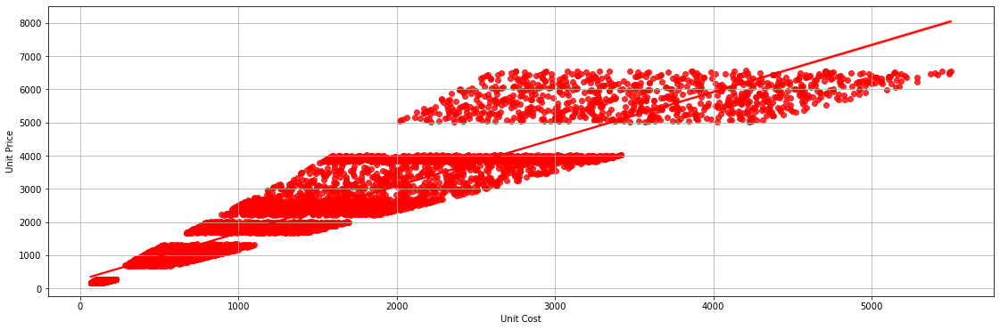

In [79]:
plt.figure(figsize=(19, 6))
sns.regplot(x='Unit Cost', y='Unit Price', data=df, color="red")
plt.grid()
plt.show()

In [80]:
df['Profit'] = (df['Unit Price'] - df['Unit Cost']) / df['Unit Price'] * 100

df.head()

,OrderNumber,Sales Channel,WarehouseCode,ProcuredDate,OrderDate,ShipDate,DeliveryDate,CurrencyCode,_SalesTeamID,_CustomerID,_StoreID,_ProductID,Order Quantity,Discount Applied,Unit Cost,Unit Price,Profit
0,SO - 000101,In-Store,WARE-UHY1004,2017-12-31,2018-05-31,2018-06-14,2018-06-19,USD,6,15,259,12,5,0.075,1001.18,1963.1,49.000051
1,SO - 000102,Online,WARE-NMK1003,2017-12-31,2018-05-31,2018-06-22,2018-02-07,USD,14,20,196,27,3,0.075,3348.66,3939.6,15.000000
2,SO - 000103,Distributor,WARE-UHY1004,2017-12-31,2018-05-31,2018-06-21,2018-01-07,USD,21,16,213,16,1,0.050,781.22,1775.5,56.000000
3,SO - 000104,Wholesale,WARE-NMK1003,2017-12-31,2018-05-31,2018-02-06,2018-07-06,USD,28,48,107,23,8,0.075,1464.69,2324.9,36.999871
4,SO - 000105,Distributor,WARE-NMK1003,2018-10-04,2018-05-31,2018-06-16,2018-06-26,USD,22,49,111,26,8,0.100,1476.14,1822.4,19.000219


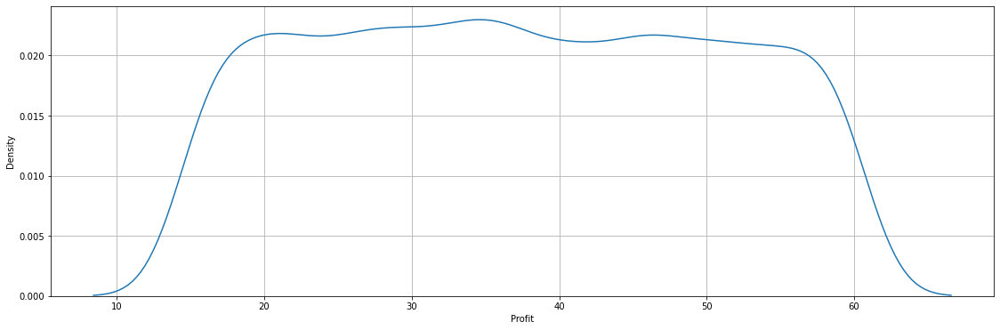

In [81]:
plt.figure(figsize=(19, 6))
sns.kdeplot(df['Profit'])
plt.grid()
plt.show()

In [82]:
df['ProcuredYear'] = df['ProcuredDate'].dt.year
df['OrderMonth'] = df['OrderDate'].dt.month
df['OrderDayOfWeek'] = df['OrderDate'].dt.dayofweek  
df['OrderYear'] = df['OrderDate'].dt.year

# Monthly procured items over time

By analysis this code we can know monthwise produce items

In [83]:
# Group by year and month to count orders
monthly_orders = df.groupby(['ProcuredYear', 'OrderMonth']).size().reset_index(name='NumOrders')

# Group by day of the week to count orders
dayofweek_orders = df.groupby('OrderDayOfWeek').size().reset_index(name='NumOrders')

# Line plot for monthly orders
fig_monthly = pe.line(monthly_orders, x='OrderMonth', y='NumOrders', color='ProcuredYear',
                      labels={'OrderMonth': 'Month', 'NumOrders': 'Number of Orders'},
                      title='Monthly procured items  Over Time',template="plotly_dark")
fig_monthly.show()

# Monthly orders items over time

By analysis this code we can  know monthwise oders items

In [84]:
# Group by year and month to count orders
monthly_orders = df.groupby(['OrderYear', 'OrderMonth']).size().reset_index(name='NumOrders')

# Group by day of the week to count orders
dayofweek_orders = df.groupby('OrderDayOfWeek').size().reset_index(name='NumOrders')

# Line plot for monthly orders
fig_monthly = pe.line(monthly_orders, x='OrderMonth', y='NumOrders', color='OrderYear',
                      labels={'OrderMonth': 'Month', 'NumOrders': 'Number of Orders'},
                      title='Monthly Orders Over Time',template="plotly_dark")
fig_monthly.show()

In [85]:
fig_waterfall = pe.bar(df, x='_ProductID', y=['Unit Price', 'Unit Cost', 'Profit'],
                       title='Waterfall Chart of Profit Margin by Product', template='plotly_dark',
                       labels={'_ProductID': 'Product', 'value': 'Amount', 'variable': 'Contribution'},
                       height=500)
fig_waterfall.update_layout(barmode='relative', showlegend=True)
fig_waterfall.show()

It shows by different slaes channels how much profit is gain  in different year, After analysis we can see that timewise profit increasing in different sales channel

In [86]:
df['Cumulative Profit Margin'] = df.groupby('Sales Channel')['Profit'].cumsum()

# Create an area plot
fig_area = pe.area(df, x='OrderDate', y='Cumulative Profit Margin', color='Sales Channel',
                   title='Cumulative Profit Margin Over Time by Sales Channel',template='plotly_dark',
                   labels={'OrderDate': 'Order Date', 'Cumulative Profit Margin': 'Cumulative Profit Margin'},
                   category_orders={"Sales Channel": ["Online", "In-Store"]})
fig_area.show()

In [87]:
df

,OrderNumber,Sales Channel,WarehouseCode,ProcuredDate,OrderDate,ShipDate,DeliveryDate,CurrencyCode,_SalesTeamID,_CustomerID,...,Order Quantity,Discount Applied,Unit Cost,Unit Price,Profit,ProcuredYear,OrderMonth,OrderDayOfWeek,OrderYear,Cumulative Profit Margin
0,SO - 000101,In-Store,WARE-UHY1004,2017-12-31,2018-05-31,2018-06-14,2018-06-19,USD,6,15,...,5,0.075,1001.18,1963.1,49.000051,2017,5,3,2018,49.000051
1,SO - 000102,Online,WARE-NMK1003,2017-12-31,2018-05-31,2018-06-22,2018-02-07,USD,14,20,...,3,0.075,3348.66,3939.6,15.000000,2017,5,3,2018,15.000000
2,SO - 000103,Distributor,WARE-UHY1004,2017-12-31,2018-05-31,2018-06-21,2018-01-07,USD,21,16,...,1,0.050,781.22,1775.5,56.000000,2017,5,3,2018,56.000000
3,SO - 000104,Wholesale,WARE-NMK1003,2017-12-31,2018-05-31,2018-02-06,2018-07-06,USD,28,48,...,8,0.075,1464.69,2324.9,36.999871,2017,5,3,2018,36.999871
4,SO - 000105,Distributor,WARE-NMK1003,2018-10-04,2018-05-31,2018-06-16,2018-06-26,USD,22,49,...,8,0.100,1476.14,1822.4,19.000219,2018,5,3,2018,75.000219
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7986,SO - 0008087,In-Store,WARE-MKL1006,2020-09-26,2020-12-30,2021-07-01,2021-01-14,USD,9,41,...,1,0.075,121.94,234.5,48.000000,2020,12,2,2020,122959.852201
7987,SO - 0008088,Online,WARE-NMK1003,2020-09-26,2020-12-30,2021-02-01,2021-04-01,USD,14,29,...,6,0.050,1921.56,3202.6,40.000000,2020,12,2,2020,90362.883762
7988,SO - 0008089,Online,WARE-UHY1004,2020-09-26,2020-12-30,2021-01-23,2021-01-26,USD,14,32,...,5,0.200,2792.76,3825.7,27.000026,2020,12,2,2020,90389.883788
7989,SO - 0008090,Online,WARE-NMK1003,2020-09-26,2020-12-30,2021-01-20,2021-01-25,USD,20,42,...,8,0.100,804.00,1072.0,25.000000,2020,12,2,2020,90414.883788


# If any outliers is present we use this code But in this dataset there are too much outliers, so we can't remove the outliers
q1=np.percentile(df["Unit Cost"],25,interpolation='midpoint')<br>
q2=np.percentile(df["Unit Cost"],50,interpolation='midpoint')<br>
q3=np.percentile(df["Unit Cost"],75,interpolation='midpoint')<br>
IQR=q3-q1<br>
low_lim=q1-1.5*IQR<br>
upp_lim=q3+1.5*IQR<br>
print('lower limit',low_lim)<br>
print('Higher limit',upp_lim)<br>

df=df[(df['Unit Cost']<upp_lim)] <br>
sns.boxplot(data=df,x='Unit Cost')<br>

In [92]:
df

,OrderNumber,Sales Channel,WarehouseCode,ProcuredDate,OrderDate,ShipDate,DeliveryDate,CurrencyCode,_SalesTeamID,_CustomerID,...,Order Quantity,Discount Applied,Unit Cost,Unit Price,Profit,ProcuredYear,OrderMonth,OrderDayOfWeek,OrderYear,Cumulative Profit Margin
0,SO - 000101,In-Store,WARE-UHY1004,2017-12-31,2018-05-31,2018-06-14,2018-06-19,USD,6,15,...,5,0.075,1001.18,1963.1,49.000051,2017,5,3,2018,49.000051
1,SO - 000102,Online,WARE-NMK1003,2017-12-31,2018-05-31,2018-06-22,2018-02-07,USD,14,20,...,3,0.075,3348.66,3939.6,15.000000,2017,5,3,2018,15.000000
2,SO - 000103,Distributor,WARE-UHY1004,2017-12-31,2018-05-31,2018-06-21,2018-01-07,USD,21,16,...,1,0.050,781.22,1775.5,56.000000,2017,5,3,2018,56.000000
3,SO - 000104,Wholesale,WARE-NMK1003,2017-12-31,2018-05-31,2018-02-06,2018-07-06,USD,28,48,...,8,0.075,1464.69,2324.9,36.999871,2017,5,3,2018,36.999871
4,SO - 000105,Distributor,WARE-NMK1003,2018-10-04,2018-05-31,2018-06-16,2018-06-26,USD,22,49,...,8,0.100,1476.14,1822.4,19.000219,2018,5,3,2018,75.000219
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7986,SO - 0008087,In-Store,WARE-MKL1006,2020-09-26,2020-12-30,2021-07-01,2021-01-14,USD,9,41,...,1,0.075,121.94,234.5,48.000000,2020,12,2,2020,122959.852201
7987,SO - 0008088,Online,WARE-NMK1003,2020-09-26,2020-12-30,2021-02-01,2021-04-01,USD,14,29,...,6,0.050,1921.56,3202.6,40.000000,2020,12,2,2020,90362.883762
7988,SO - 0008089,Online,WARE-UHY1004,2020-09-26,2020-12-30,2021-01-23,2021-01-26,USD,14,32,...,5,0.200,2792.76,3825.7,27.000026,2020,12,2,2020,90389.883788
7989,SO - 0008090,Online,WARE-NMK1003,2020-09-26,2020-12-30,2021-01-20,2021-01-25,USD,20,42,...,8,0.100,804.00,1072.0,25.000000,2020,12,2,2020,90414.883788


Drop unnecessary columns

In [93]:
df.drop(columns=['ProcuredYear',
                     'OrderMonth',
                     'OrderDayOfWeek',
                     'OrderYear',
                     'Profit',
                     
                     'Cumulative Profit Margin',
                     'WarehouseCode',
                     'ProcuredDate',
                     'OrderDate',
                     'ShipDate',
                     'DeliveryDate',
                     'CurrencyCode',
                     'OrderNumber'],inplace=True)

In [94]:
df

,Sales Channel,_SalesTeamID,_CustomerID,_StoreID,_ProductID,Order Quantity,Discount Applied,Unit Cost,Unit Price
0,In-Store,6,15,259,12,5,0.075,1001.18,1963.1
1,Online,14,20,196,27,3,0.075,3348.66,3939.6
2,Distributor,21,16,213,16,1,0.050,781.22,1775.5
3,Wholesale,28,48,107,23,8,0.075,1464.69,2324.9
4,Distributor,22,49,111,26,8,0.100,1476.14,1822.4
...,...,...,...,...,...,...,...,...,...
7986,In-Store,9,41,339,29,1,0.075,121.94,234.5
7987,Online,14,29,202,3,6,0.050,1921.56,3202.6
7988,Online,14,32,241,35,5,0.200,2792.76,3825.7
7989,Online,20,42,112,36,8,0.100,804.00,1072.0


In [95]:
df['Discount Percentage'] = (df['Discount Applied'] / df['Unit Price']) * 100
df['Total Revenue'] = (df['Unit Price'] * df['Order Quantity']) * (1 - df['Discount Applied'])
df['Profit'] = df['Total Revenue'] - (df['Unit Cost'] * df['Order Quantity'])

In [96]:
df

,Sales Channel,_SalesTeamID,_CustomerID,_StoreID,_ProductID,Order Quantity,Discount Applied,Unit Cost,Unit Price,Discount Percentage,Total Revenue,Profit
0,In-Store,6,15,259,12,5,0.075,1001.18,1963.1,0.003820,9079.3375,4073.4375
1,Online,14,20,196,27,3,0.075,3348.66,3939.6,0.001904,10932.3900,886.4100
2,Distributor,21,16,213,16,1,0.050,781.22,1775.5,0.002816,1686.7250,905.5050
3,Wholesale,28,48,107,23,8,0.075,1464.69,2324.9,0.003226,17204.2600,5486.7400
4,Distributor,22,49,111,26,8,0.100,1476.14,1822.4,0.005487,13121.2800,1312.1600
...,...,...,...,...,...,...,...,...,...,...,...,...
7986,In-Store,9,41,339,29,1,0.075,121.94,234.5,0.031983,216.9125,94.9725
7987,Online,14,29,202,3,6,0.050,1921.56,3202.6,0.001561,18254.8200,6725.4600
7988,Online,14,32,241,35,5,0.200,2792.76,3825.7,0.005228,15302.8000,1339.0000
7989,Online,20,42,112,36,8,0.100,804.00,1072.0,0.009328,7718.4000,1286.4000


<AxesSubplot:>

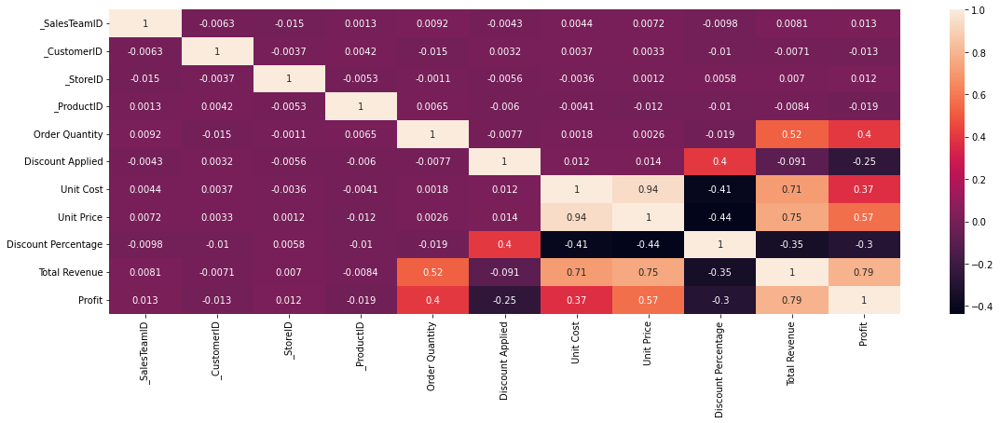

In [97]:
plt.figure(figsize=(19, 6))
sns.heatmap(df.corr(),annot=True)

Profit Across Sales Channels:
In-Store sales tend to generate the highest profit, followed by Online sales.
Distributor sales result in moderate profit.
Wholesale sales yield the lowest profit among the sales channels.

Profit and Order Quantity:
There is a positive correlation between order quantity and profit. As the order quantity increases, the profit also tends to increase. This suggests that larger orders can lead to higher profits.

Unit Cost and Unit Price:
There is a relationship between unit cost and unit price. When the unit cost increases, the unit price also tends to increase. This implies that higher costs are typically passed on to customers through higher prices.

Discount Percentage and Profit:
When the discount percentage is less than 0.1%, the profit tends to be high. However, when the discount percentage exceeds this threshold, the profit tends to decrease. This indicates that offering excessive discounts can negatively impact profitability.

Total Revenue and Profit:
There is a positive association between total revenue and profit. As total revenue increases, profit also tends to increase. This demonstrates that higher sales volumes can lead to higher profits, assuming costs and discounts are managed effectively.

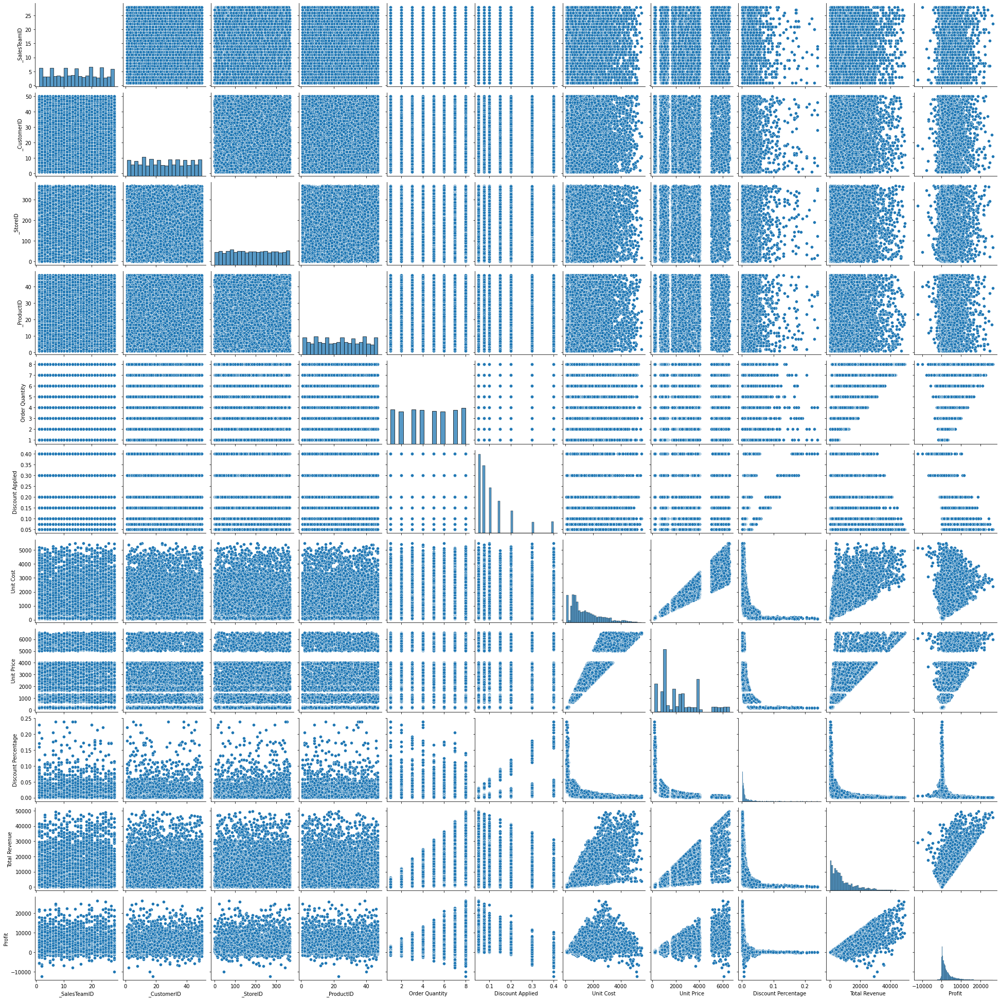

In [98]:
sns.pairplot(data=df)

In [99]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

df["Sales Channel"] = encoder.fit_transform(df["Sales Channel"])

In [100]:
scaling = ["Sales Channel", "Order Quantity", "Unit Cost", "Unit Price", "Discount Applied", "Total Revenue"]

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df[scaling] = scaler.fit_transform(df[scaling])

<function skew at 0x0000026133757430>
0.1864808178527026


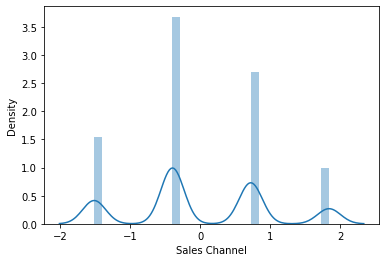

<function skew at 0x0000026133757430>
0.01212886626212817


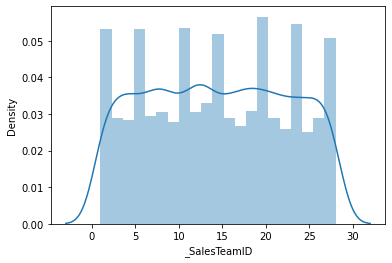

<function skew at 0x0000026133757430>
0.01722722994675169


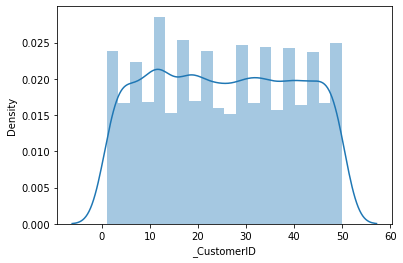

<function skew at 0x0000026133757430>
0.014520297888876781


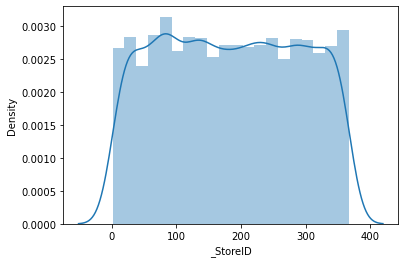

<function skew at 0x0000026133757430>
0.016040754724921596


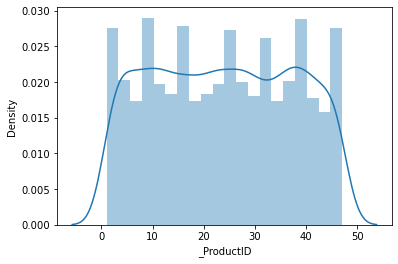

<function skew at 0x0000026133757430>
-0.004191194796456711


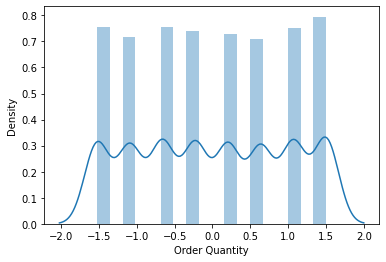

<function skew at 0x0000026133757430>
1.9618184331303192


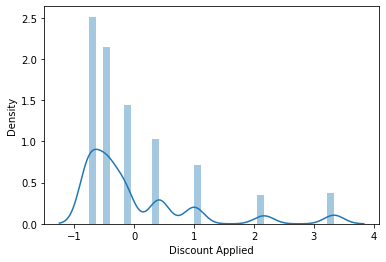

<function skew at 0x0000026133757430>
1.0914290881179476


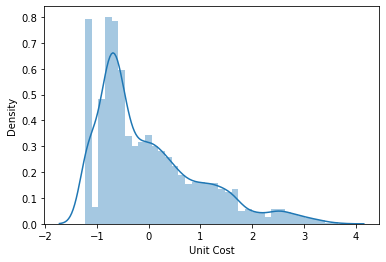

<function skew at 0x0000026133757430>
0.852054438261432


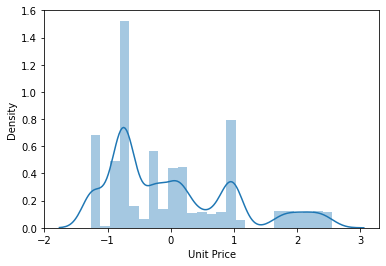

<function skew at 0x0000026133757430>
5.173288879973397


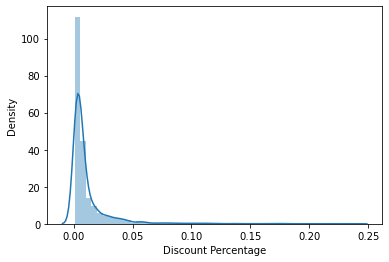

<function skew at 0x0000026133757430>
1.5951825105602935


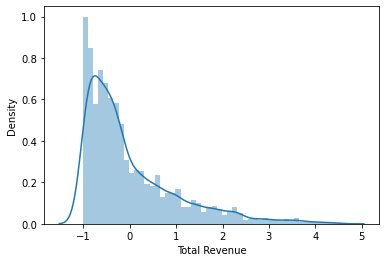

<function skew at 0x0000026133757430>
2.2443378757936014


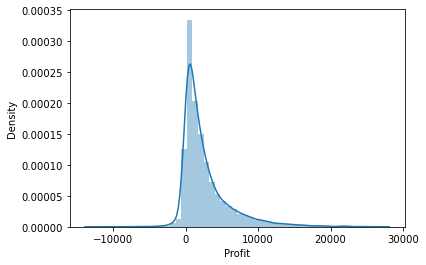

In [101]:
from scipy.stats import skew
for c in df.columns:
    print(skew)
    print(skew(df[c]))
    sns.distplot(df[c])
    plt.show()

In [102]:
df

,Sales Channel,_SalesTeamID,_CustomerID,_StoreID,_ProductID,Order Quantity,Discount Applied,Unit Cost,Unit Price,Discount Percentage,Total Revenue,Profit
0,-0.397639,6,15,259,12,0.205259,-0.460403,-0.387229,-0.192133,0.003820,-0.008282,4073.4375
1,0.722789,14,20,196,27,-0.659611,-0.460403,1.723162,0.989284,0.001904,0.199445,886.4100
2,-1.518068,21,16,213,16,-1.524481,-0.752579,-0.584974,-0.304267,0.002816,-0.836995,905.5050
3,1.843218,28,48,107,23,1.502564,-0.460403,0.029468,0.024127,0.003226,0.902523,5486.7400
4,-1.518068,22,49,111,26,1.502564,-0.168227,0.039762,-0.276234,0.005487,0.444820,1312.1600
...,...,...,...,...,...,...,...,...,...,...,...,...
7986,-0.397639,9,41,339,29,-1.524481,-0.460403,-1.177668,-1.225372,0.031983,-1.001761,94.9725
7987,0.722789,14,29,202,3,0.637694,-0.752579,0.440195,0.548756,0.001561,1.020291,6725.4600
7988,0.722789,14,32,241,35,0.205259,1.000477,1.223407,0.921202,0.005228,0.689369,1339.0000
7989,0.722789,20,42,112,36,1.502564,-0.168227,-0.564494,-0.724771,0.009328,-0.160844,1286.4000


In [103]:
df = df.copy()

df.drop(columns=['_SalesTeamID','_CustomerID','_StoreID','_ProductID'],inplace=True)

In [104]:
x=df.iloc[:,:-1]
x

,Sales Channel,Order Quantity,Discount Applied,Unit Cost,Unit Price,Discount Percentage,Total Revenue
0,-0.397639,0.205259,-0.460403,-0.387229,-0.192133,0.003820,-0.008282
1,0.722789,-0.659611,-0.460403,1.723162,0.989284,0.001904,0.199445
2,-1.518068,-1.524481,-0.752579,-0.584974,-0.304267,0.002816,-0.836995
3,1.843218,1.502564,-0.460403,0.029468,0.024127,0.003226,0.902523
4,-1.518068,1.502564,-0.168227,0.039762,-0.276234,0.005487,0.444820
...,...,...,...,...,...,...,...
7986,-0.397639,-1.524481,-0.460403,-1.177668,-1.225372,0.031983,-1.001761
7987,0.722789,0.637694,-0.752579,0.440195,0.548756,0.001561,1.020291
7988,0.722789,0.205259,1.000477,1.223407,0.921202,0.005228,0.689369
7989,0.722789,1.502564,-0.168227,-0.564494,-0.724771,0.009328,-0.160844


In [105]:
y=df.iloc[:,-1]
y

0       4073.4375
1        886.4100
2        905.5050
3       5486.7400
4       1312.1600
          ...    
7986      94.9725
7987    6725.4600
7988    1339.0000
7989    1286.4000
7990    3371.7750
Name: Profit, Length: 7991, dtype: float64

In [106]:
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.2,random_state=42)

In [107]:
print(xtrain.shape)
print(xtest.shape)
print(ytrain.shape)
print(ytest.shape)

(6392, 7)
(1599, 7)
(6392,)
(1599,)


# Data Modeling

In [108]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score,mean_absolute_error

# Use Different Types of Algorithms

In [109]:
def mymodel(model, xtrain, ytrain, xtest, ytest):
    model.fit(xtrain, ytrain)
    ypred = model.predict(xtest)
    
    # Checking regression metrics
    mse = mean_squared_error(ytest, ypred)
    r2 = r2_score(ytest, ypred)
    
    mse = mean_squared_error(ytest, ypred)
    rmse = mean_squared_error(ytest, ypred, squared=False)  # Calculate RMSE
    mae = mean_absolute_error(ytest, ypred)
    r2 = r2_score(ytest, ypred)

# Print the metrics
    print(f"Mean Squared Error (MSE): {mse}")
   
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"R-squared (R2): {r2}")

    return model


In [110]:
RR = mymodel(RandomForestRegressor(), xtrain, ytrain, xtest, ytest)

Mean Squared Error (MSE): 152619.66707661824
Mean Absolute Error (MAE): 226.33112030956852
R-squared (R2): 0.9862132088567153


In [111]:
svm = mymodel(SVR(), xtrain, ytrain, xtest, ytest)

Mean Squared Error (MSE): 10827291.805937165
Mean Absolute Error (MAE): 1897.853425238564
R-squared (R2): 0.021924148865325233


In [112]:
DR = mymodel(DecisionTreeRegressor(), xtrain, ytrain, xtest, ytest)

Mean Squared Error (MSE): 551567.7077767863
Mean Absolute Error (MAE): 405.21221232020014
R-squared (R2): 0.950174515944388


In [113]:
knn = mymodel(KNeighborsRegressor(), xtrain, ytrain, xtest, ytest)

Mean Squared Error (MSE): 736697.1232385805
Mean Absolute Error (MAE): 546.1625234521576
R-squared (R2): 0.9334509793626391


In [114]:
#hyperparameters

gbr_params = {'n_estimators': 1000,
          'max_depth': 3,
          'min_samples_split': 5,
          'learning_rate': 0.01,
          'loss': 'ls'}
print(gbr_params)

{'n_estimators': 1000, 'max_depth': 3, 'min_samples_split': 5, 'learning_rate': 0.01, 'loss': 'ls'}


In [115]:
from sklearn.ensemble import GradientBoostingRegressor
Gbr=GradientBoostingRegressor(**gbr_params)
Gbr.fit(xtrain,ytrain)

GradientBoostingRegressor(learning_rate=0.01, loss='ls', min_samples_split=5,
                          n_estimators=1000)

In [116]:
train=Gbr.score(xtrain,ytrain)
train

0.9796508700522956

In [117]:
test=Gbr.score(xtest,ytest)
test

0.9691968801077704

Here we use different type of algorithm but RandomForest Regressor gives best accuracy, so we consider randomforest for this prediction

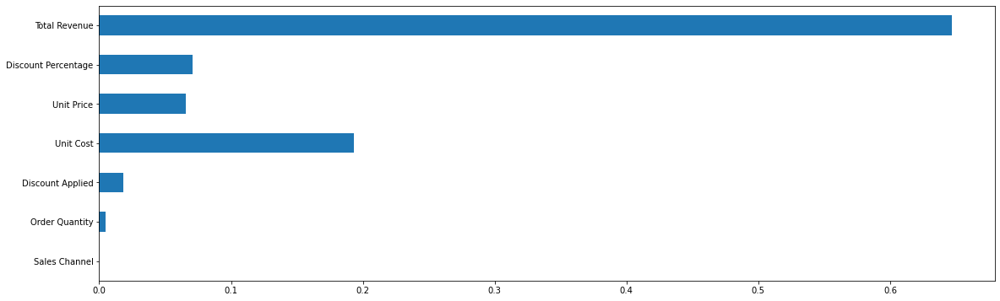

In [119]:
#Shows which column are more important for the dataset
plt.figure(figsize=(19, 6))
feat_importance=pd.Series(Gbr.feature_importances_,index=x.columns)
feat_importance.plot(kind="barh")
plt.show()

In [ ]:
ypred=rr.predict(xtest)

In [ ]:
ypred

In [ ]:
#This basically shows that the model we created gives us very good result

In [ ]:

plt.figure(figsize=(19, 6))
sns.distplot(ytest-ypred)

# Joblib helps to save the analysis file

In [ ]:
import joblib

In [ ]:
joblib.dump(rr,"SALES_PREDICTION")

In [ ]:
x.columns

In [ ]:
data_new=pd.DataFrame({
    'Sales Channel':-0.397639,
    "Order Quantity":0.205,
    "Discount Applied":-0.46,
    "Unit Cost":-0.38,
    "Unit Price":-0.192,
    "Discount Percentage":0.003,
    "Total Revenue":-0.008
},index=[0])

In [ ]:
rr.predict(data_new)

# To make the GUI we use tkinter

In [ ]:
from tkinter import *
import joblib

x=df.iloc[:,:-1]
y=df.iloc[:,-1]

# To make the GUI we train all the dataset

In [ ]:
rr=RandomForestRegressor()
rr.fit(x,y)

In [ ]:
df.columns

In [121]:
from tkinter import *

In [ ]:
def sales():
    p1=float(e1.get())
    p2=float(e2.get())
    p3=float(e3.get())
    p4=float(e4.get())
    p5=float(e5.get())
    p6=float(e6.get())
    p7=float(e7.get())
 
    
    model=joblib.load("SALES_PREDICTION")
    data_new=pd.DataFrame({
    'Sales Channel':p1,
    "Order Quantity":p2,
    "Discount Applied":p3,
    "Unit Cost":p4,
    "Unit Price":p5,
    "Discount Percentage":p6,
    "Total Revenue":p7,
   
},index=[0])
    result=model.predict(data_new)
    Label(cp,text="SALES PRIDICTION").grid()
    Label(cp,text=result).grid(row=10)
    print("SALES PREDICTION",result[0])
    



cp=Tk()
cp.title("Predicted Sales by using Ml")
cp.geometry("400x300")


label=Label(cp,text="Predicted Sales by using Ml",
           bg="black",fg="white").grid(row=0,columnspan=2)
Label(cp,text="Sales Channel").grid(row=1)
Label(cp,text="Order Quantity").grid(row=2)
Label(cp,text="Discount Applied").grid(row=3)
Label(cp,text="Unit Cost").grid(row=4)
Label(cp,text="Unit Price").grid(row=5)
Label(cp,text="Discount Percentage").grid(row=6)
Label(cp,text="Total Revenue").grid(row=7)


e1=Entry(cp)
e2=Entry(cp)
e3=Entry(cp)
e4=Entry(cp)
e5=Entry(cp)
e6=Entry(cp)
e7=Entry(cp)


e1.grid(row=1,column=1)
e2.grid(row=2,column=1)
e3.grid(row=3,column=1)
e4.grid(row=4,column=1)
e5.grid(row=5,column=1)
e6.grid(row=6,column=1)
e7.grid(row=7,column=1)


Button(cp,text="Predict",command=sales,font=("Arial",15)).grid()
mainloop()

